In [1]:
%reload_ext autoreload
%autoreload 2

import pandas as pd
from matplotlib import pyplot as plt
import coinbase_reader
import os
from dotenv import load_dotenv
from pathlib import Path

load_dotenv()

base_dir = Path.cwd()
exchange = os.getenv('COINAPI_EXCHANGE')
base_currency = os.getenv('COINAPI_BASE_CURRENCY')

# Make charts interactive
# %matplotlib widget
%matplotlib inline

In [2]:
data_dir = os.path.join(base_dir, f'../{exchange.lower()}_data')
print(f'Reading data from {data_dir}')
closes = coinbase_reader.read('close', data_dir=data_dir, exchange=exchange, base_currency=base_currency)
volume = coinbase_reader.read('volume', data_dir=data_dir, exchange=exchange, base_currency=base_currency)

print(f'Got {len(closes.columns)} cryptos with max {len(closes)} lines')
print('Cryptos are:')
print(closes.columns.to_list())

Reading data from /Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data
Got 655 historical files
Remove BINANCE_SPOT_ and _USDT
Read files [['LQTY', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/historical/BINANCE_SPOT_LQTY_USDT.csv'], ['XVS', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/historical/BINANCE_SPOT_XVS_USDT.csv'], ['VANA', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/historical/BINANCE_SPOT_VANA_USDT.csv'], ['VOXEL', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/historical/BINANCE_SPOT_VOXEL_USDT.csv'], ['ADX', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/historical/BINANCE_SPOT_ADX_USDT.csv'], ['MAGIC', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/historical/BINANCE_SPOT_MAGIC_USDT.csv'], ['AION', '/Users/fs/Documents/Aktien/Code/Python/2025-11-crypto/src/../binance_data/histor

Most recent nominal volume:
BTC      1.476997e+09
ETH      9.857867e+08
SOL      2.848018e+08
FDUSD    1.910230e+08
XRP      1.787671e+08
             ...     
TKO      1.549597e+05
OSMO     1.545701e+05
GNS      1.499748e+05
QI       1.272067e+05
ATA      1.183047e+05
Name: 2026-04-07 00:00:00+00:00, Length: 402, dtype: float64
Highest mean volume:
PEPE       1.060106e+13
BTTC       1.682821e+12
BONK       1.484741e+12
SHIB       1.368261e+12
LUNC       1.595777e+11
               ...     
ALLO                NaN
PLA                 NaN
AAVEUP              NaN
ADADOWN             NaN
USDSB               NaN
Name: 2026-04-07 00:00:00+00:00, Length: 647, dtype: float64
Highest closes:
BTC        68853.66
WBTC       68783.97
YFI         2458.00
WBETH       2303.78
ETH         2107.16
             ...   
KAT             NaN
PLA             NaN
AAVEUP          NaN
ADADOWN         NaN
USDSB           NaN
Name: 2026-04-07 00:00:00+00:00, Length: 647, dtype: float64


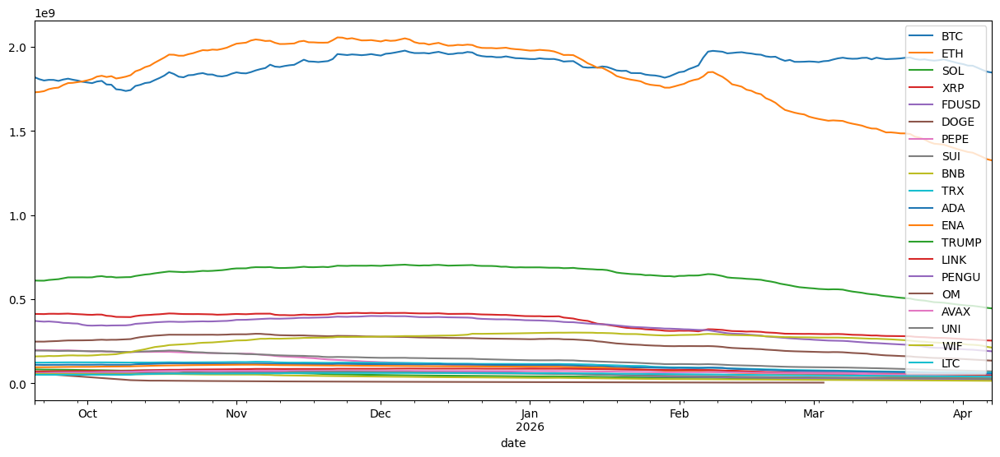

Out of 647 cryptos, 540 are relevant for the index:
['LQTY', 'XVS', 'VANA', 'VOXEL', 'ADX', 'MAGIC', 'AION', 'GLM', 'SXPUP', 'RONIN', 'ZIL', 'HOLO', 'BNBUP', 'RLC', 'BNBDOWN', 'DATA', 'WIF', 'SEI', 'AVNT', 'TRX', 'OG', 'BZRX', 'CHR', 'ANT', 'NXPC', 'SKL', 'SCROLL', 'STORJ', 'LINK', 'MEME', 'WAVES', 'PDA', 'PENDLE', 'USUAL', 'DOGE', 'FIDA', 'BAND', 'ONE', '1000CAT', 'ERA', 'NU', 'DGB', 'OM', 'BURGER', 'INJ', 'GAL', 'XRP', 'DEXE', 'NOT', 'XPL', 'T', 'ILV', 'COCOS', 'LTC', 'PLUME', 'BTS', 'AUDIO', 'AMP', 'EIGEN', 'INIT', 'SUSHIDOWN', 'PERL', 'SUSHIUP', 'MATIC', 'HUMA', 'NEWT', 'ACT', 'TLM', 'XEM', 'HOOK', 'NEIRO', 'DUSK', 'KLAY', 'GMT', 'PUMP', 'THE', 'LINA', 'XTZUP', 'TUT', 'BAR', 'YFIDOWN', 'AI', 'MIRA', 'NPXS', 'DOLO', 'LINKUP', 'IOST', 'TRXDOWN', '1MBABYDOGE', 'LOKA', 'BFUSD', 'AUD', 'AGLD', 'YGG', '1INCHDOWN', 'GFT', 'C98', 'BAL', 'ETHFI', 'ARKM', 'ALICE', 'DENT', 'MOVR', 'TNSR', 'BMT', 'WTC', 'FDUSD', 'THETA', 'GAS', 'LTCUP', 'BICO', 'VTHO', 'EUR', 'KEY', 'JASMY', 'CVX', 'XVG', 'LPT

In [3]:
# Slow down volume for index; we don't want to add / remove cryptos constantly
window_size = 180
mean_volume = volume.rolling(window=window_size).mean()
nominal_volume = mean_volume * closes

print('Most recent nominal volume:')
print(nominal_volume.iloc[-1].dropna().sort_values(ascending=False));
print('Highest mean volume:')
print(mean_volume.iloc[-1].sort_values(ascending=False));
print('Highest closes:')
print(closes.iloc[-1].sort_values(ascending=False));

# Use average volume * average price as the weight for the instruments for the index (for the next
# period)
mean_nominal_volume = mean_volume * closes.rolling(window=window_size).mean()

youngest = mean_nominal_volume.iloc[-200:]
top20_cols = youngest.iloc[0].nlargest(20).index
youngest[top20_cols].plot(figsize=(15, 6))
plt.show()

# Use a hard cut for small nominal volumes
nominal_volume_threshold = 5_000_000
index_nominal_volume = nominal_volume[mean_nominal_volume > nominal_volume_threshold]
index_nominal_volume.dropna(axis=1, how='all', inplace=True)
index_nominal_volume.dropna(axis=0, how='all', inplace=True)
print(f'Out of {len(closes.columns)} cryptos, {len(index_nominal_volume.columns)} are relevant for the index:')
print(index_nominal_volume.columns.to_list())

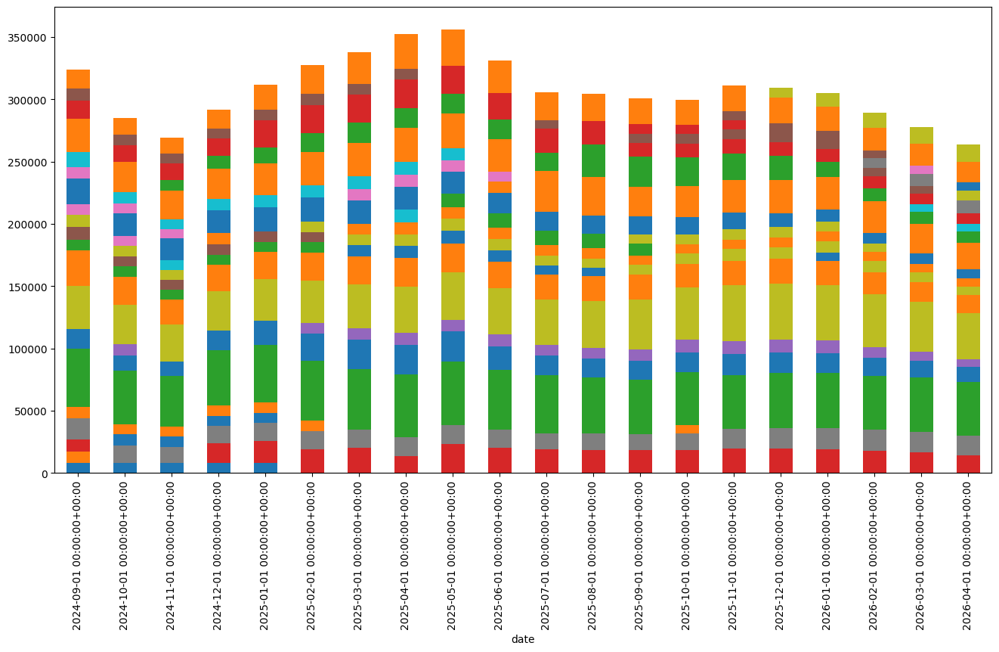

Latest data
BTC      16.52%
ETH      14.10%
SOL       8.18%
XRP       6.15%
BNB       5.81%
FDUSD     5.40%
ZEC       5.27%
DOGE      4.56%
USD1      4.09%
SUI       3.32%
TRX       3.10%
ADA       2.97%
USDE      2.92%
PEPE      2.77%
LINK      2.65%
XPL       2.56%
AVAX      2.47%
TAO       2.46%
LTC       2.43%
ENA       2.25%
Name: 2026-04-01 00:00:00+00:00, dtype: object


In [4]:
# for index, row in index_nominal_volume.iterrows():
#   print(f'{index}: {row.dropna().to_dict()}')

# index_nominal_volume.iloc[-20:].plot(kind='bar', stacked=True, legend=False)
# plt.show()

dates = index_nominal_volume.index.to_series()
month_changes = dates[dates.dt.month != dates.shift(1).dt.month]
index_weights = pd.DataFrame()
adjustment = 1

index_weights = mean_nominal_volume.loc[month_changes.index]
index_weights = index_weights.apply(lambda row: row.nlargest(20), axis=1)
# Using pow(0.5) gives more weight to small constituents and reduces the weight of large ones;
# if we don't, Bitcoin has a share of approx. 30%
index_weights = index_weights.pow(0.5)
# index_weights = index_weights.pow(2)
# index_weights[:] = 0
# index_weights['BTC'] = 0.9
# index_weights['ETH'] = 0.1
index_weights.iloc[-20:].plot(figsize=(16, 8), kind='bar', stacked=True, legend=False)
plt.show()

index_weights.to_csv('index_weights.csv')

print('Latest data')
latest = index_weights.iloc[-1].dropna().sort_values(ascending=False)
latest_percent = latest / latest.sum() * 100
latest_percent_formatted = latest_percent.apply(lambda x: f'{x:.2f}%')
print(latest_percent_formatted)

In [5]:
raw_index = {}

def calculate_index_row(close_row, weight_row):
    return (close_row * weight_row).sum()

# Index: 1000 on 2018-01-01
adjustment_factor = 0.01
print('initial factor', adjustment_factor)
current_weight_index = 0
for current_index, row in closes.iterrows():
    print(current_index)
    current_weights = index_weights.iloc[current_weight_index].dropna()
    current_closes = closes.loc[current_index].dropna()
    print(current_closes.to_dict())
    print(current_weights.to_dict())
    # Month change: Update the adjustment_factor. Get the value of the current closes with the
    # previous weights and then the new weights; adjust the new weights so that the value exactly
    # matches the previous one.
    value = calculate_index_row(current_closes, current_weights) * adjustment_factor
    if current_index in index_weights.index and current_weight_index + 1 < len(index_weights):
        print('---')
        next_weights = index_weights.iloc[current_weight_index + 1].dropna()
        next_weight_value = calculate_index_row(current_closes, next_weights) * adjustment_factor
        print(f'prev {value}, next {next_weight_value}')
        adjustment_factor = adjustment_factor * (value / next_weight_value)
        current_weight_index += 1
        print('adj', adjustment_factor)
        print('---')
    print(value)
    raw_index[current_index] = value

index = pd.Series(raw_index)
index.name = 'value'
index.index.name = 'date'

initial factor 0.01
2017-08-18 00:00:00+00:00
{'ETH': 302.0, 'BTC': 4285.08}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
429973.58780118386
2017-08-19 00:00:00+00:00
{'ETH': 293.96, 'BTC': 4108.37}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
412486.22349597747
2017-08-20 00:00:00+00:00
{'ETH': 290.91, 'BTC': 4139.98}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
415366.1978716976
2017-08-21 00:00:00+00:00
{'ETH': 299.1, 'BTC': 4086.29}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
410640.9369648552
2017-08-22 00:00:00+00:00
{'ETH': 323.29, 'BTC': 4016.0}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
405199.4157581618
2017-08-23 00:00:00+00:00
{'ETH': 309.8, 'BTC': 4040.0}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
406768.1601908536
2017-08-24 00:00:00+00:00
{'ETH': 315.74, 'BTC': 4114.01}
{'BTC': 9644.496319068674, 'ETH': 5529.538056965519}
414234.50647718005
2017-08-25 00:00:00+00:00
{'ETH': 323.42, 'BTC': 4316.01}
{'BTC': 9644.49631906

2018-01-01
1363459.5387407234
date
2017-08-18 00:00:00+00:00    4.299736e+05
2017-08-19 00:00:00+00:00    4.124862e+05
2017-08-20 00:00:00+00:00    4.153662e+05
2017-08-21 00:00:00+00:00    4.106409e+05
2017-08-22 00:00:00+00:00    4.051994e+05
                                 ...     
2026-04-03 00:00:00+00:00    6.130191e+06
2026-04-04 00:00:00+00:00    6.135632e+06
2026-04-05 00:00:00+00:00    6.166921e+06
2026-04-06 00:00:00+00:00    6.324515e+06
2026-04-07 00:00:00+00:00    6.308341e+06
Name: value, Length: 3155, dtype: float64


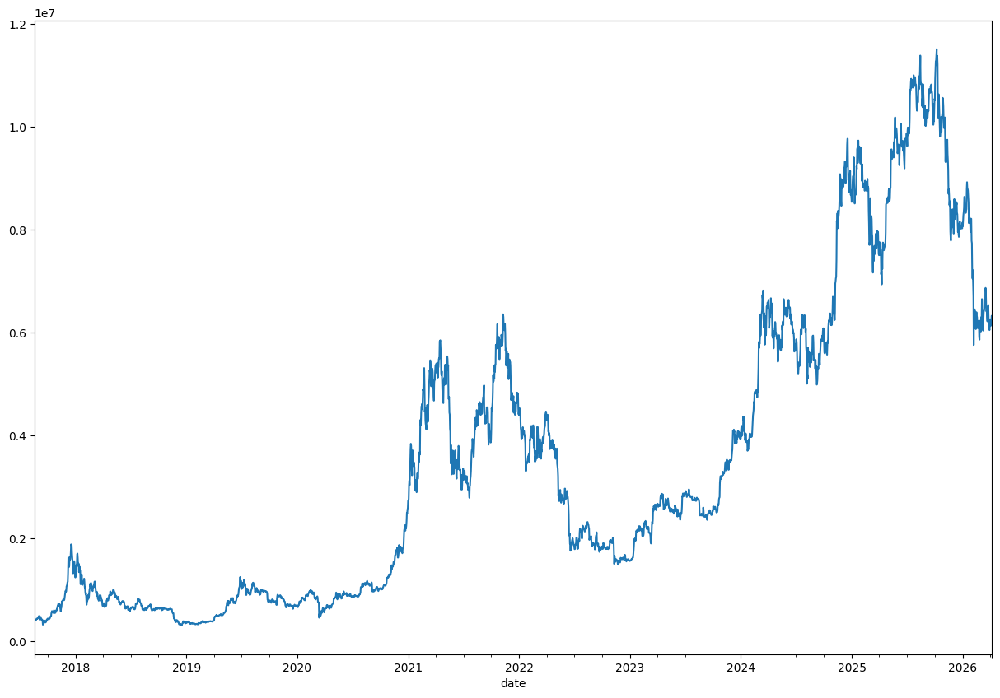

date
2026-03-29 00:00:00+00:00    1.000000
2026-03-30 00:00:00+00:00    0.994501
2026-03-31 00:00:00+00:00    1.006577
2026-04-01 00:00:00+00:00    1.029426
2026-04-02 00:00:00+00:00    1.027340
2026-04-03 00:00:00+00:00    1.008373
2026-04-04 00:00:00+00:00    1.009268
2026-04-05 00:00:00+00:00    1.014415
2026-04-06 00:00:00+00:00    1.040338
2026-04-07 00:00:00+00:00    1.037678
Name: value, dtype: float64


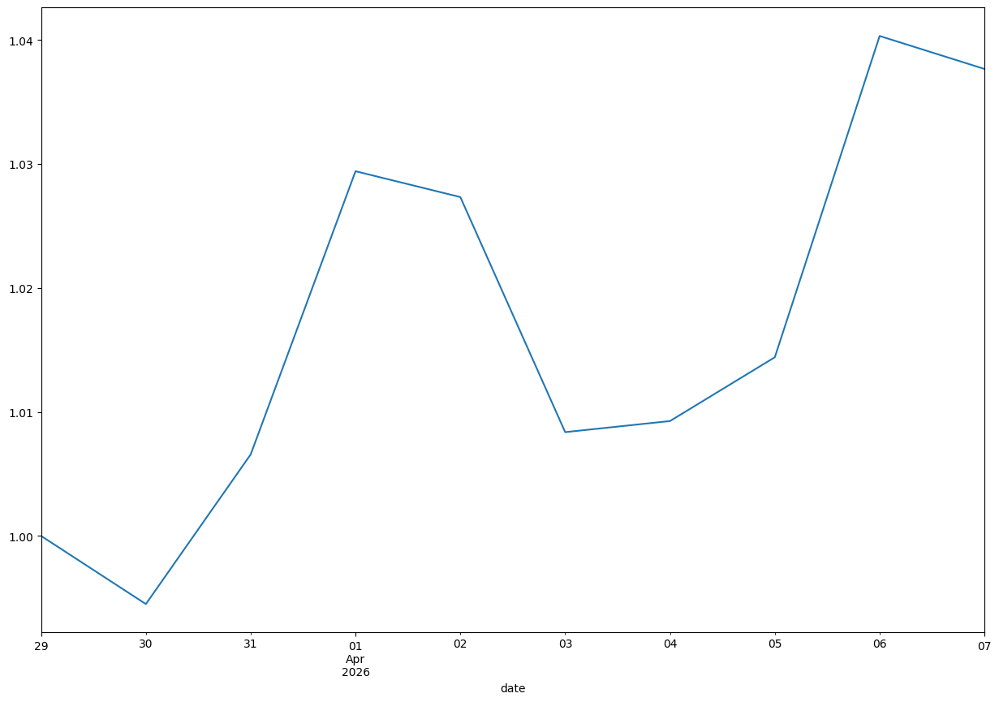

In [6]:
print('2018-01-01')
print(index['2018-01-01'])
print(index)
index.plot(figsize=(15, 10), legend=False)
plt.show()
recent_relative = index.iloc[-10:] / index.iloc[-10]
print(recent_relative)
recent_relative.plot(figsize=(15, 10), legend=False)
plt.show()

index.to_csv('./index.csv')